# Setting Source Folder

In [1]:
import os, sys


filedir = os.path.abspath(".")

currentdir = os.path.dirname(os.path.abspath(".")) # workaround to adding local modules

parentdir = os.path.dirname(os.path.abspath(""+currentdir))
print(f'CurrentDir: {currentdir}')
print(f'ParentDir: {parentdir}')

sys.path.insert(0, currentdir)

CurrentDir: g:\Meu Drive\Estudos\Pós Graduação\MESTRADO\projeto\git\multimorbity_use
ParentDir: g:\Meu Drive\Estudos\Pós Graduação\MESTRADO\projeto\git


# Installing Libraries

In [2]:
# !pip install -r requirements.txt

# Import Libraries

In [3]:
import pandas as pd
import numpy as np
import os.path as osp
import seaborn as sns
import matplotlib.pyplot as plt

from src.visualization.data_visualization import plot, heat_map_corr
from src.utils.utils import time_diff_str, now, now_str

# from pandas_profiling import ProfileReport

import warnings
warnings.filterwarnings("ignore")

pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_columns = None
pd.options.display.max_rows = 100

# Definitions

In [4]:
DATA_PATH = osp.join('..', 'data', 'raw','dataset_baseline.xlsx')

In [5]:
pdf = pd.read_excel(DATA_PATH, sheet_name = 0, header = 0)

In [6]:
morbidades = [
'ost',
'art',
'has',
'diab',
'pcor',
'park',
'rin',
'tire',
'glau',
'cat',
'alzh',
'inc',
'hepat',
'dor',
'out',
'cancer',
'dpoc',
'enfs',
'pros',
'asm',
'brq'
]

extras = [
    'depre_cut',
    'ansi_cut',
    'dep',
    'alc2',
    'fumo2',
    'obesidade',
    'asmbrq',
]

In [7]:
pdf['multi_calc'] = pdf[morbidades].isin(['sim',1,'Sim','1']).sum(axis=1)

In [8]:
pdf.sample(10)

,record_id,dt,hora,entrev,setor,domicilio,endpdr,idaderc,sexorc,recusa,recusaout,latitude,longitude,nmor,sexomor1,idademor1,trabmor1,atforamor1,sexomor2,idademor2,trabmor2,atforamor2,sexomor3,idademor3,trabmor3,atforamor3,sexomor4,idademor4,trabmor4,atforamor4,sexomor5,idademor5,trabmor5,atforamor5,sexomor6,idademor6,trabmor6,atforamor6,sexomor7,idademor7,trabmor7,atforamor7,sexomor8,idademor8,trabmor8,atforamor8,sexomor9,idademor9,trabmor9,atforamor9,sexomor10,idademor10,trabmor10,atforamor10,bairro,cep,dn,genero,cor,ler,escol,sit,osit,altura,peso,conj,trab,rendapd,fumo,tafumo,tmfumo,tpafumo,tpmfumo,cigdia,audit1,audit2,audit3,audit4,audit5,audit6,audit7,audit8,audit9,audit10,abmicro,CW,ablav,abgel,abfree,ablavr,tv,tvcabo,abdvd,abmco,ac,abmoto,abauto,abseca,pecas,abban,abemd,abag,abpav,vz,md,abesc,renda,ajudarenda,ajudacovid___0,ajudacovid___1,ajudacovid___2,ajudacovid___3,ajudacovid___9,alirenda,cmdac,cmddn,dnali,dmali,mcom,cam,camt,aff,afft,afm,afmt,dcam,dcamt,dbici,dbicit,exer,exert,sent,deit,tvs,ppaf,atd,uatd,atdpt,jnprecisou,jnbuscou,jnconseguiu,jnondebuscou,jnmotivonao,plano,qplan,medenf,tamenf,tmmenf,imedenf,imedenfout,pref,postoqual,hmed,hmedout,nserv,tserv,tservout,eserv,eservout,introcovid,qcovid,tratcovid,rtestefam,tratcovidfam,covidfam,covidamg,vacina,dtvac,dtvac2,mvac,mvacout,vgp0,vgp1,cdt,ldt,mdt,omdt,autsa,comsa,idsa,sat,qsono,tsono,dcosta,bsec,asm,brq,enfs,dpoc,tpul___1,tpul___2,tpul___3,tpul___4,tpul___5,tpul___6,chiado,nmed,medind,medd,aqmed,inaf,ost,art,has,diab,pcor,park,rin,tire,glau,cat,alzh,inc,hepat,dor,out,outqual,dgp,qdgp___1,qdgp___2,qdgp___3,qdgp___4,qdgp___5,qdgp___6,qdgp___7,qdgp___8,qdgp___9,qdgp___10,qdgp___11,qdgp___12,qdgp___13,qdgp___14,qdgp___15,qdgp___16,qdgp___17,qdgp___18,qdgp___19,ang,avc,vavc,colt,epil,vepil,dep,ulc,itu,vitu,flu,vflu,pnm,vpnm,ca,taca,tmca,lca,ttca,pfarm,hemo,qtp,rtp,outt,qoutt,qued,vqued,acam,taacam,tmacam,inth,intht,poucoint9,pbaixo9,difsono9,cans9,semapetite9,sentiumal9,difconc9,lento9,ferir9,diftrab9,nerv7,imped7,preocup7,relax7,agit7,abor7,medo7,ajucama,ajumed,ajutare,ajuref,pessoamt,amor,abraco,queame,pessoamta,ouvir,confiar,compart,comprob,pessoaem,conselho,infajuda,quercons,sugprobm,pessoainf,fazagrad,discab,relax,divertir,pessoasp,ppeso,fraco,devg,menosaf,difcoisa,esfo,atvpd,banho,vestir,cama,lugares,banheiro,alimentar,cappd,mcj,dge,dsp,vlc,sozi,serv,idag,qserv,horafim,conj3,cor4,estudo4cat,cancer,fumo2,alc2,peso1,altura1,bmi,bmi4cat,obesidade,rendasetor,merge1,rensetor10,urg,rensetor5,_Irensetor1_2,_Irensetor1_3,_Irensetor1_4,_Irensetor1_5,_Irensetor1_6,_Irensetor1_7,_Irensetor1_8,_Irensetor1_9,_Irensetor1_10,banheiroabep,empabep,carroabep,microabep,lavaloucabep,gelaabep,freeabep,lavaroupaabep,dvdabep,microondasabep,motoabep,secaabep,chefeabep,aguaabep,pavabep,abep,abepcat,esc4j,sexj,cor2,abep4,j,ds,esperado,total,id4,mor2,idibge,pw,pw1,pop,estrato,idade,icovid,depre1,depre2,depre3,depre4,depre5,depre6,depre7,depre8,depre9,depress,depre_algo,depresscat,phq_sum_b,depre_cut,ansi1,ansi2,ansi3,ansi4,ansi5,ansi6,ansi7,ansiss,ansi_algo,gad_sum_b,ansi_cut,gad_sintomas,gad_severity,gad_severo,phq_severity,popw,is,id2,pros,multi,m2,m3,hospit,cmdac1,cmddn1,dnali1,dmali1,mcom1,inseg,testecovid,tcovid,ende,_merge,asmbrq,multi_calc
1593,5035,2021-09-28,14:13:00,Claudia,431440705160103 - CENTRO,Elegível,NaN,NaN,NaN,NaN,NaN,"-317,820,428.00","-523,398,523.00",2,Feminino,21,Estuda,NaN,Feminino,46.00,Trabalha,Não,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Centro,96010040,2000-05-15,Mulher cisgênera (1),Branca,sim,3º série do 2º grau (antigo colegial: clássico...,Estudando,NaN,157,50.00,solteiro(a) ou sem companheiro(a),não,Permaneceu igual,"já fumou, mas parou de fumar",8.00,0.00,1,0,6,nunca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Não possui,1,Não possui,"Sim, uma","Sim, uma","Sim, uma","Sim, duas",Não,Não possui,"Sim, uma",Não possui,Não possui,Não possui,Não possui,2.00,1.00,nenhuma,Rede geral d

In [9]:
pdf[morbidades + ['multi_calc']].sample(10)

,ost,art,has,diab,pcor,park,rin,tire,glau,cat,alzh,inc,hepat,dor,out,cancer,dpoc,enfs,pros,asm,brq,multi_calc
5629,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,0
3094,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,0
315,Não,Não,Não,Não,Não,Não,Não,Sim,Não,Não,Não,Não,Não,Sim,Sim,1.00,Não,Não,Não,Não,Não,4
3958,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,0
4553,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,0
1535,Sim,Sim,Sim,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Sim,Não,0.00,Não,Não,Não,Não,Não,4
2292,Não,Não,Sim,Não,Sim,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,2
964,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,0
4751,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,0
3210,Não,Não,Sim,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,Não,0.00,Não,Não,Não,Não,Não,1


In [10]:
pdf.shape

(5722, 441)

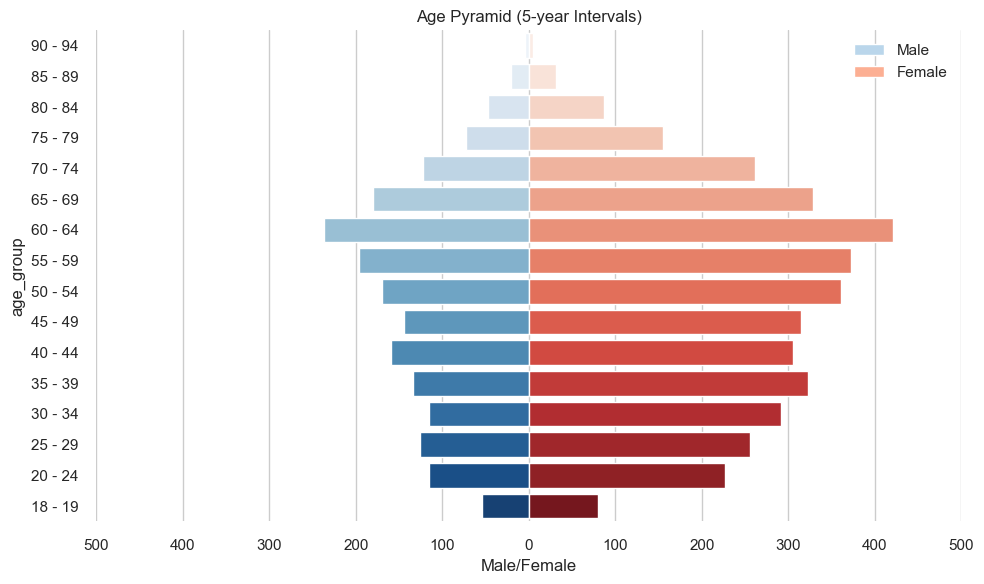

In [71]:
# Age Pyramid

# Bin the age groups in 5-year intervals
pdf['age_group'] = pd.cut(pdf['idade'], bins=np.arange(15, 100, 5), right=False)

pyramid_df = pdf.copy()

pyramid_df = pyramid_df.dropna(subset=['age_group'])

# Reverse the order of age groups
age_labels = sorted(pyramid_df['age_group'].unique(), reverse = True)
pyramid_df['age_group'] = pd.Categorical(pyramid_df['age_group'], categories=age_labels, ordered=True)

# Calculate population counts for each age group and gender
df_counts = pyramid_df.groupby(['age_group', 'sexj']).size().reset_index(name='Population')

# Pivot the data to create separate columns for male and female populations
df_pivot = df_counts.pivot(index='age_group', columns='sexj', values='Population').reset_index()

df_pivot['male'] = df_pivot['male'] * -1

sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(10, 6))

ax1 = sns.barplot(x='male', y='age_group', data=df_pivot, palette='Blues', ax=ax)
ax2 = sns.barplot(x='female', y='age_group', data=df_pivot, palette='Reds', ax=ax)

# Create custom legend
custom_legend = [
    plt.Rectangle((0, 0), 1, 1, fc=sns.color_palette('Blues')[1]),
    plt.Rectangle((0, 0), 1, 1, fc=sns.color_palette('Reds')[1])
]

# Add legend
ax.legend(custom_legend, ['Male', 'Female'], loc='upper right')

ax.set_title("Age Pyramid (5-year Intervals)")
ax.set_xlabel("Male/Female")

ax.set_xticks(ticks=[-500, -400, -300, -200, -100, 0, 100, 200, 300, 400, 500])
ax.set_xticklabels(labels=[500, 400, 300, 200, 100, 0, 100, 200, 300, 400, 500])

ax.set_yticks(np.arange(len(df_pivot['age_group'])))
ax.set_yticklabels([f"{age.left} - {age.right-1}" for age in df_pivot['age_group'][:-1]]  + ['18 - 19'], rotation=0)

sns.despine(left=True, bottom=True)
plt.tight_layout()

plt.show()

In [14]:
pdf['multi_calc_adjust'] = pdf['multi_calc'].apply(lambda x: str(x) if x<=7 else '>7')

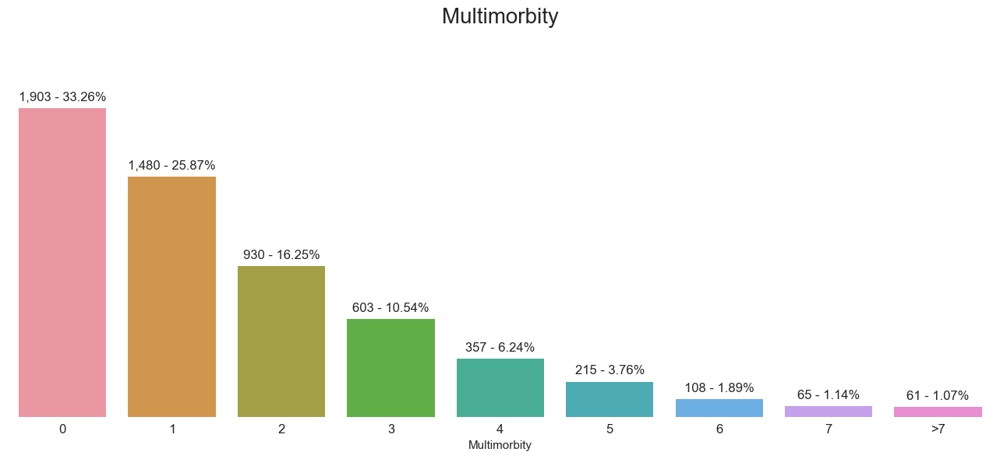

In [20]:
plt.style.use("seaborn-white")  

fig, ax = plot(
    function='countplot',
    df=pdf,
    columns=['multi_calc_adjust'],
    title='Multimorbity',
    subtitles = None,
    title_fontsize = 20,
    ncols=1,
    plot_size=(13,6),
    ha="center",
    rotation = 0
    )

ax.set_xticklabels(ax.get_xticklabels(),rotation=0, rotation_mode="anchor", ha='center')
ax.set_xlabel("Multimorbity")

ax.set_yticks([])
ax.set_ylabel('')

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

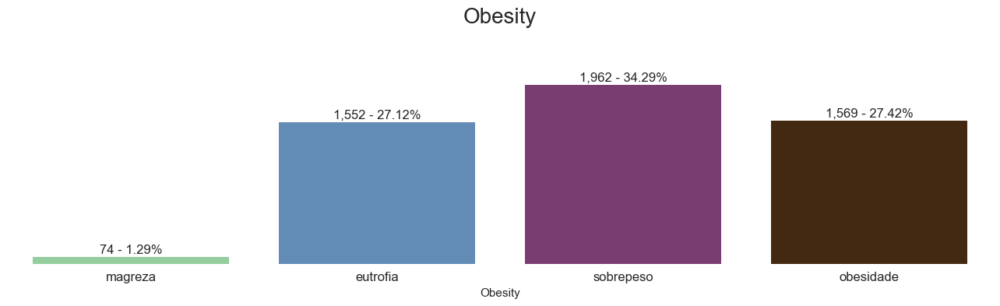

In [22]:
plt.style.use("seaborn-white")  

fig, ax = plot(
    function='countplot',
    df=pdf,
    columns=['bmi4cat'],
    title='Obesity',
    subtitles = None,
    title_fontsize = 20,
    ncols=1,
    plot_size=(13,4), 
    order = ['magreza', 'eutrofia', 'sobrepeso','obesidade'],
    rotation = 0
    )

ax.set_xticklabels(ax.get_xticklabels(),rotation=0, rotation_mode="anchor", ha='center')
ax.set_xlabel("Obesity")

ax.set_yticks([])
ax.set_ylabel('')

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

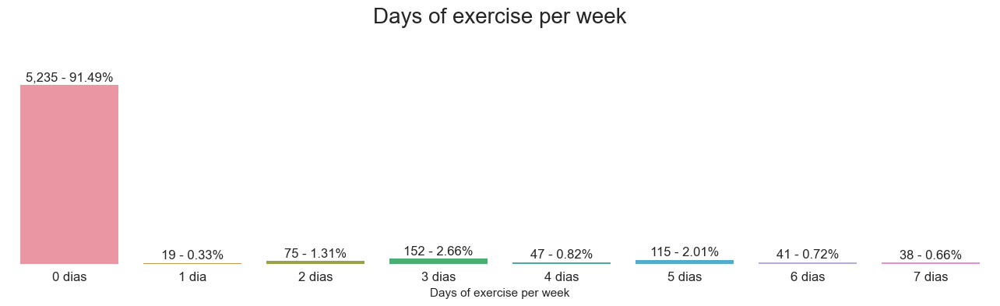

In [30]:
plt.style.use("seaborn-white")  

fig, ax = plot(
    function='countplot',
    df=pdf.fillna('0 dias'),
    columns=['exert'],
    title='Days of exercise per week',
    subtitles = None,
    title_fontsize = 20,
    ncols=1,
    plot_size=(13,4), 
    order = ['0 dias', '1 dia', '2 dias', '3 dias', '4 dias', '5 dias', '6 dias', '7 dias'],
    rotation = 0
    )

ax.set_xticklabels(ax.get_xticklabels(),rotation=0, rotation_mode="anchor", ha='center')
ax.set_xlabel("Days of exercise per week")

ax.set_yticks([])
ax.set_ylabel('')

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

In [ ]:
plt.style.use("seaborn-white")  

fig, ax = plot(
    function='countplot',
    df=pdf,
    columns=['qsono'],
    title='Sleep Quality',
    subtitles = None,
    title_fontsize = 20,
    ncols=1,
    plot_size=(13,4), 
    order = ['Muito ruim','Ruim', 'Regular', 'Boa','Muito boa', 'Não sabe/não respondeu'],
    rotation = 0
    )

ax.set_xticklabels(ax.get_xticklabels(),rotation=0, rotation_mode="anchor", ha='center')
ax.set_xlabel("Sleep Quality")

ax.set_yticks([])
ax.set_ylabel('')

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

<AxesSubplot:xlabel='bmi', ylabel='Density'>

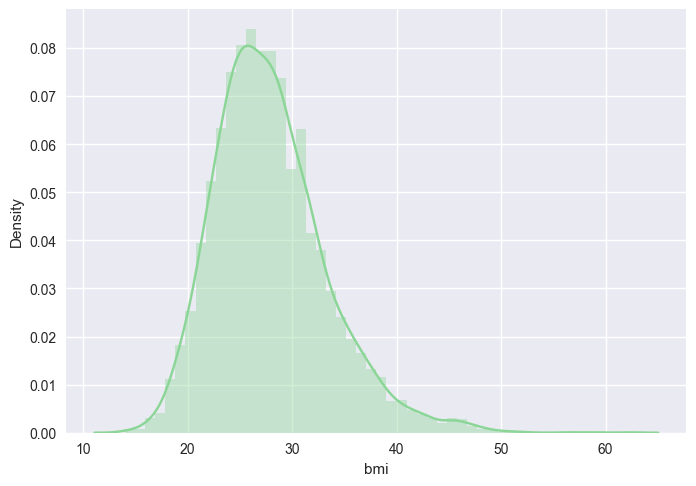

In [8]:
sns.distplot(pdf.dropna(subset=['bmi'])['bmi'])

(<Figure size 1000x600 with 1 Axes>,
 <AxesSubplot:title={'center':'bmi'}, xlabel='bmi', ylabel='Count'>)

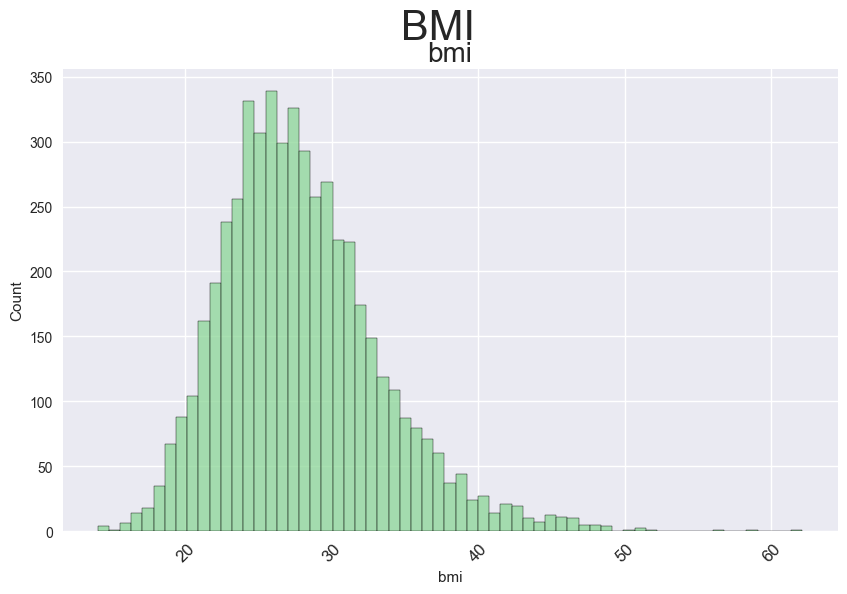

In [9]:
plot(function='histplot', df=pdf.dropna(subset=['bmi']), columns=['bmi'], title='BMI', ncols=1)

<AxesSubplot:>

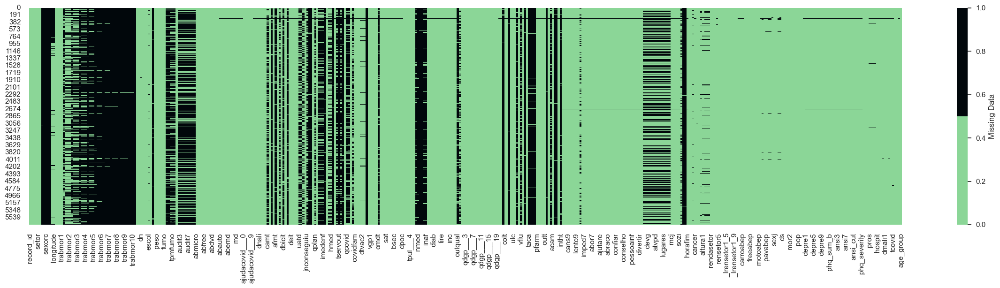

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(30,6))
sns.heatmap(pdf.isna(),
            cmap=sns.cubehelix_palette(2,start=.45, rot=-1.75, gamma=2, hue=1.25),
            cbar_kws={'label': 'Missing Data'}, )

In [6]:
TARGET = 'hospital_death'
categorical_features=[
    'hospital_id'
    ,'elective_surgery'
    , 'ethnicity'
    , 'gender'
    , 'icu_id'
    , 'icu_admit_source'
    , 'icu_stay_type'
    , 'icu_type'
    , 'apache_2_diagnosis'
    , 'apache_2_bodysystem'
    , 'apache_3j_bodysystem'
    , 'apache_3j_diagnosis'
    , 'apache_post_operative'
    , 'arf_apache'
    , 'gcs_eyes_apache'
    , 'gcs_motor_apache'
    , 'gcs_unable_apache'
    , 'gcs_verbal_apache'
    , 'intubated_apache'
    , 'ventilated_apache'
    , 'aids'
    , 'cirrhosis'
    , 'diabetes_mellitus'
    , 'hepatic_failure'
    , 'immunosuppression'
    , 'leukemia'
    , 'lymphoma'
    , 'solid_tumor_with_metastasis'
]

numeric_features = list(set(pdf.columns) - set (categorical_features) - set([TARGET]))
# numeric_features.remove(TARGET)

selected_features = set(categorical_features + numeric_features + [TARGET])

# Reading Dataset

In [ ]:
pdf = pd.read_csv(DATA_PATH)

In [51]:
pdf[categorical_features]= pdf[categorical_features].astype(object)

In [52]:
# Select only the columns that are needed
pdf = pdf[selected_features]

In [53]:
pdf.shape

(91713, 82)

In [72]:
if not osp.exists(osp.join('..', 'data', 'raw')):
    os.makedirs(osp.join('..', 'data', 'raw'))

pdf.to_parquet(osp.join('..', 'data', 'raw', 'clean_dataset.parquet'))

# Exploratory Data Analysis

In [5]:
pdf = pd.read_parquet(osp.join('..', 'data', 'raw','clean_dataset.parquet'))

In [55]:
pdf.sample(10)

,weight,gcs_unable_apache,intubated_apache,gcs_verbal_apache,immunosuppression,d1_temp_min,d1_temp_max,apache_2_diagnosis,d1_glucose_min,h1_resprate_min,h1_heartrate_min,d1_potassium_max,lymphoma,d1_mbp_max,d1_sysbp_noninvasive_max,d1_mbp_noninvasive_max,icu_id,h1_sysbp_noninvasive_max,apache_4a_hospital_death_prob,h1_sysbp_max,h1_sysbp_min,d1_sysbp_min,h1_sysbp_noninvasive_min,h1_mbp_min,h1_mbp_noninvasive_min,h1_resprate_max,d1_resprate_min,temp_apache,h1_mbp_noninvasive_max,gcs_motor_apache,d1_mbp_noninvasive_min,cirrhosis,d1_heartrate_min,icu_type,gcs_eyes_apache,icu_admit_source,age,d1_mbp_min,d1_glucose_max,map_apache,elective_surgery,aids,hospital_death,ethnicity,d1_sysbp_noninvasive_min,h1_spo2_max,d1_diasbp_noninvasive_max,leukemia,heart_rate_apache,apache_4a_icu_death_prob,icu_stay_type,d1_diasbp_min,d1_resprate_max,d1_potassium_min,d1_diasbp_noninvasive_min,resprate_apache,h1_spo2_min,d1_spo2_max,gender,height,d1_heartrate_max,h1_diasbp_noninvasive_max,apache_3j_bodysystem,ventilated_apache,apache_post_operative,d1_spo2_min,hepatic_failure,d1_diasbp_max,pre_icu_los_days,bmi,h1_heartrate_max,h1_diasbp_min,hospital_id,h1_diasbp_max,apache_3j_diagnosis,h1_diasbp_noninvasive_min,diabetes_mellitus,solid_tumor_with_metastasis,apache_2_bodysystem,arf_apache,d1_sysbp_max,h1_mbp_max
52043,100.00,0.00,0.00,5.00,0.00,36.70,37.20,113.00,117.00,12.00,105.00,3.20,0.00,85.00,140.00,85.00,550,140.00,0.03,140.00,96.00,79.00,96.00,67.00,67.00,16.00,7.00,36.70,82.00,1.00,53.00,0.00,40.00,Neuro ICU,4.00,Accident & Emergency,54.00,53.00,124.00,53.00,0,0.00,0,Caucasian,79.00,98.00,78.00,0.00,117.00,0.01,admit,43.00,19.00,3.10,43.00,7.00,95.00,100.00,M,180.30,116.00,77.00,Sepsis,0.00,0,94.00,0.00,78.00,0.22,30.76,111.00,57.00,26,77.00,502.01,57.00,0.00,0.00,Cardiovascular,0.00,140.00,82.00
56912,86.18,0.00,0.00,5.00,0.00,36.70,37.30,122.00,92.00,11.00,59.00,4.40,0.00,130.00,170.00,130.00,619,148.00,0.00,148.00,142.00,120.00,142.00,83.00,83.00,15.00,8.00,37.10,103.00,6.00,83.00,0.00,58.00,CCU-CTICU,4.00,Accident & Emergency,55.00,83.00,129.00,130.00,0,0.00,0,Caucasian,120.00,100.00,124.00,0.00,58.00,0.00,admit,60.00,23.00,4.20,60.00,8.00,97.00,100.00,M,182.90,77.00,91.00,Metabolic,0.00,0,93.00,0.00,124.00,0.17,25.76,68.00,60.00,39,91.00,703.03,60.00,0.00,0.00,Metabolic,0.00,170.00,103.00
67600,97.50,0.00,1.00,1.00,0.00,35.80,37.60,308.00,106.00,NaN,76.00,4.80,0.00,74.00,137.00,93.00,683,NaN,0.01,104.00,104.00,104.00,NaN,64.00,NaN,NaN,25.00,35.80,NaN,5.00,49.00,0.00,76.00,Med-Surg ICU,2.00,Operating Room / Recovery,67.00,64.00,242.00,56.00,1,0.00,0,African American,71.00,100.00,73.00,0.00,100.00,0.01,admit,50.00,28.00,3.30,41.00,38.00,100.00,100.00,M,172.70,94.00,NaN,Cardiovascular,1.00,1,99.00,0.00,58.00,0.29,32.69,76.00,50.00,64,50.00,"1,207.01",NaN,1.00,0.00,Undefined diagnoses,0.00,136.00,64.00
77598,57.50,0.00,0.00,5.00,0.00,36.20,36.40,117.00,NaN,23.00,94.00,NaN,0.00,107.00,162.00,107.00,814,152.00,0.02,152.00,123.00,120.00,123.00,79.00,79.00,26.00,13.00,NaN,107.00,6.00,72.00,0.00,70.00,Med-Surg ICU,4.00,Accident & Emergency,62.00,72.00,NaN,76.00,0,0.00,0,Caucasian,120.00,100.00,88.00,0.00,130.00,0.01,admit,55.00,31.00,NaN,55.00,27.00,98.00,100.00,F,162.60,130.00,85.00,Cardiovascular,1.00,0,90.00,0.00,88.00,0.12,21.75,130.00,64.00,181,85.00,106.01,64.00,0.00,0.00,Cardiovascular,0.00,162.00,107.00
89800,47.60,0.00,0.00,5.00,0.00,36.30,37.40,122.00,100.00,20.00,87.00,3.80,0.00,90.00,138.00,90.00,874,118.00,NaN,118.00,110.00,100.00,110.00,69.00,69.00,28.00,16.00,35.80,74.00,6.00,63.00,0.00,60.00,Med-Surg ICU,4.00,Accident & Emergency,18.00,63.00,100.00,63.00,0,0.00,0,Caucasian,100.00,99.00,74.00,0.00,46.00,NaN,admit,52.00,28.00,3.50,52.00,4.00,97.00,99.00,F,157.50,100.00,61.00,Metabolic,0.00,0,97.00,0.00,74.00,0.17,19.19,99.00,55.00,142,61.00,703.03,55.00,0.00,0.00,Metabolic,0.00,138.00,74.00
39528,87.30,0.00,0.00,1.00,0.00,34.90,37.00,308.00,91.00,14.00,84.00,5.40,0.00,93.00,139.00,93.00,479,98.00,0.09,98.00,67.00,67.00,67.00,54.00,54.0

In [56]:
pdf.info(verbose=True,memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 82 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   weight                         88993 non-null  float64
 1   gcs_unable_apache              90676 non-null  object 
 2   intubated_apache               90998 non-null  object 
 3   gcs_verbal_apache              89812 non-null  object 
 4   immunosuppression              90998 non-null  object 
 5   d1_temp_min                    89389 non-null  float64
 6   d1_temp_max                    89389 non-null  float64
 7   apache_2_diagnosis             90051 non-null  object 
 8   d1_glucose_min                 85906 non-null  float64
 9   h1_resprate_min                87356 non-null  float64
 10  h1_heartrate_min               88923 non-null  float64
 11  d1_potassium_max               82128 non-null  float64
 12  lymphoma                       90998 non-null 

In [57]:
pdf.isnull().sum()*100/len(pdf)

weight                           2.97
gcs_unable_apache                1.13
intubated_apache                 0.78
gcs_verbal_apache                2.07
immunosuppression                0.78
d1_temp_min                      2.53
d1_temp_max                      2.53
apache_2_diagnosis               1.81
d1_glucose_min                   6.33
h1_resprate_min                  4.75
h1_heartrate_min                 3.04
d1_potassium_max                10.45
lymphoma                         0.78
d1_mbp_max                       0.24
d1_sysbp_noninvasive_max         1.12
d1_mbp_noninvasive_max           1.61
icu_id                           0.00
h1_sysbp_noninvasive_max         8.00
apache_4a_hospital_death_prob    8.67
h1_sysbp_max                     3.94
h1_sysbp_min                     3.94
d1_sysbp_min                     0.17
h1_sysbp_noninvasive_min         8.00
h1_mbp_min                       5.06
h1_mbp_noninvasive_min           9.90
h1_resprate_max                  4.75
d1_resprate_

In [58]:
pdf.describe(percentiles=[.1,.2,.3,.4,.5,.6,.7,.8,.9]).T

,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
weight,"88,993.00",84.03,25.01,38.60,56.00,63.50,69.60,75.00,80.30,86.10,92.90,101.60,115.70,186.00
d1_temp_min,"89,389.00",36.27,0.75,31.89,35.60,36.00,36.20,36.30,36.40,36.50,36.60,36.70,36.90,37.80
d1_temp_max,"89,389.00",37.28,0.69,35.10,36.60,36.80,36.90,37.00,37.11,37.30,37.50,37.77,38.20,39.90
d1_glucose_min,"85,906.00",114.38,38.27,33.00,76.00,87.00,94.00,101.00,107.00,115.00,125.00,138.00,161.00,288.00
h1_resprate_min,"87,356.00",17.21,6.07,0.00,11.00,13.00,14.00,15.00,16.00,18.00,19.00,21.00,24.00,189.00
h1_heartrate_min,"88,923.00",83.66,20.28,36.00,60.00,66.00,72.00,77.00,82.00,87.00,93.00,101.00,111.00,144.00
d1_potassium_max,"82,128.00",4.25,0.67,2.80,3.50,3.70,3.90,4.00,4.20,4.30,4.50,4.70,5.10,7.00
d1_mbp_max,"91,493.00",104.65,20.81,60.00,81.00,88.00,93.00,98.00,102.00,107.00,113.00,120.00,132.00,184.00
d1_sysbp_noninvasive_max,"90,686.00",148.24,25.79,90.00,117.00,126.00,133.00,140.00,146.00,152.00,160.00,169.00,183.00,232.00
d1_mbp_noninvasive_max,"90,234.00",104.59,20.70,60.00,81.00,87.00,93.00,98.00,102.00,107.00,113.00,120.00,132.00,181.00


### First we will understand the distribuition of the target

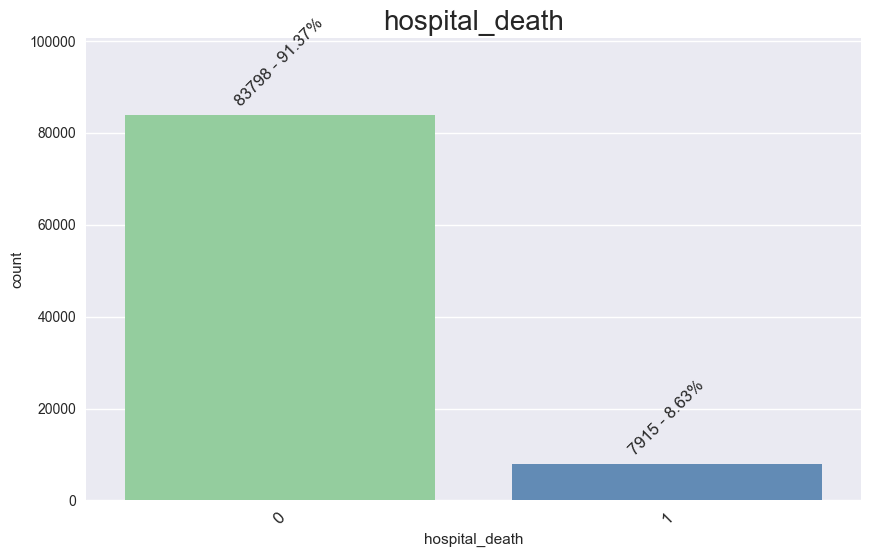

In [59]:
plot(function='countplot', df=pdf, columns=[TARGET], title='', ncols=1)

### Categorical Features

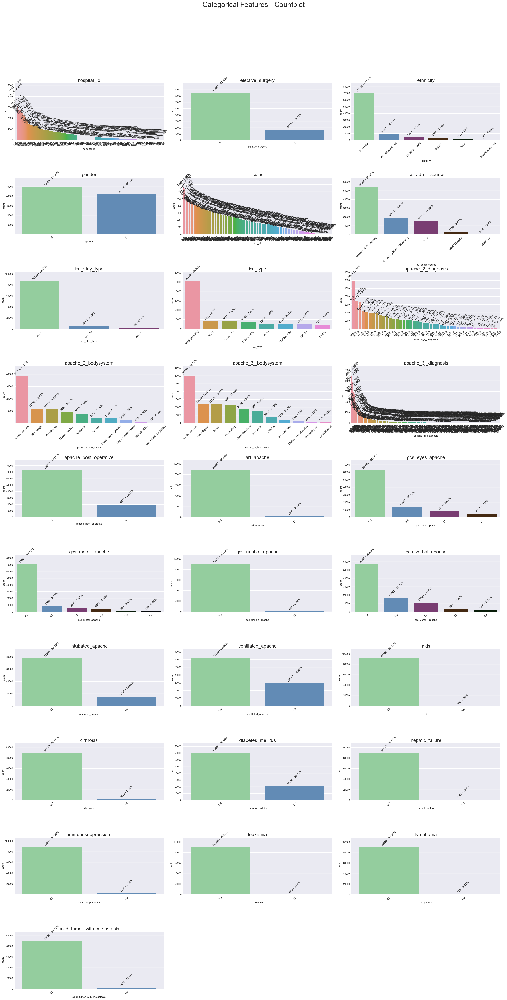

In [60]:
plot(function='countplot',df=pdf, columns=categorical_features,title='Categorical Features - Countplot', ncols = 3, save_path='./figures/categorical_features_countplot.png', dpi = 300)

### Numeric Features

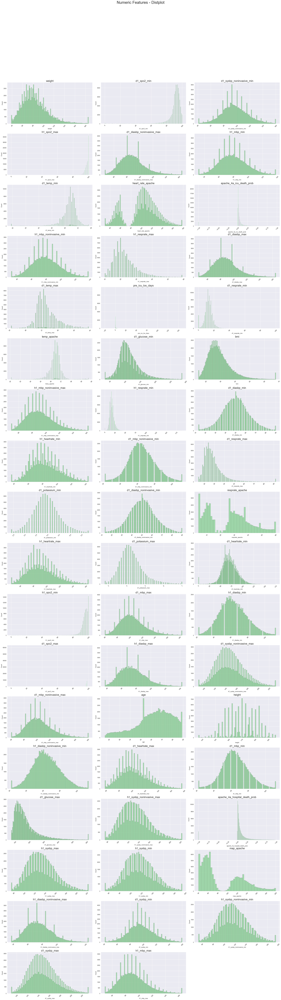

In [61]:
plot(function='histplot', df=pdf, columns=numeric_features, title='Numeric Features - Distplot', ncols=3, save_path='./figures/numeric_features_histogram.png', dpi = 200)

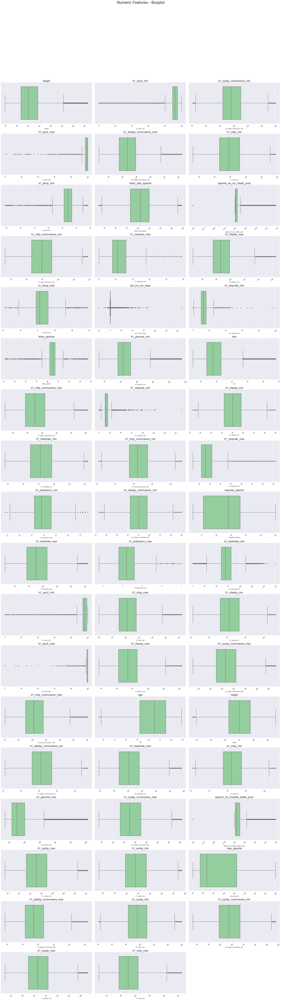

In [62]:
plot(function='boxplot',df=pdf, columns=numeric_features,title='Numeric Features - Boxplot', ncols=3, save_path='./figures/numeric_features_boxplot.png', dpi = 200)

## Understanding the features and their relation with the target

##### Categorical Features

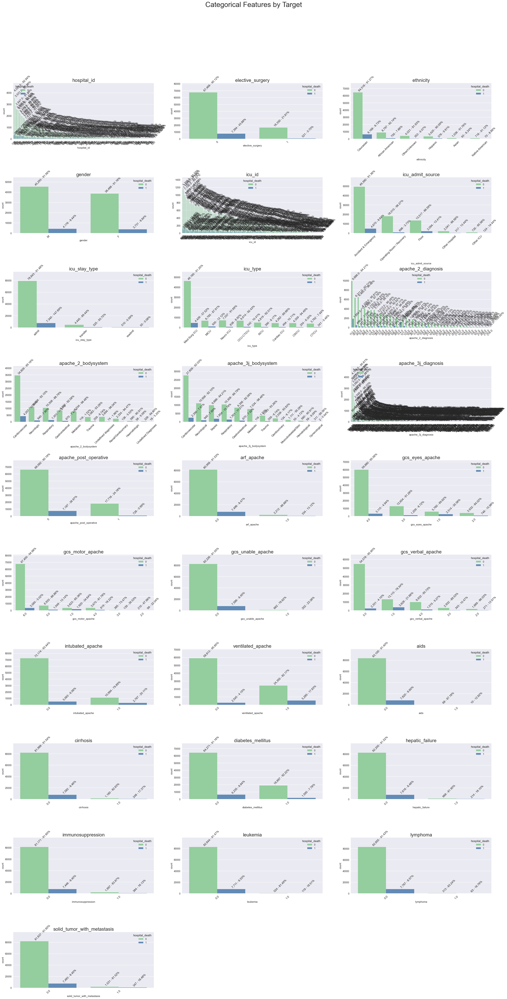

In [7]:
plot(function='countplot',df=pdf, by = TARGET, columns=categorical_features, title='Categorical Features by Target', ncols = 3, save_path='./figures/categorical_features_x_target.png', dpi = 200, ha = 'left')

##### Numeric Features

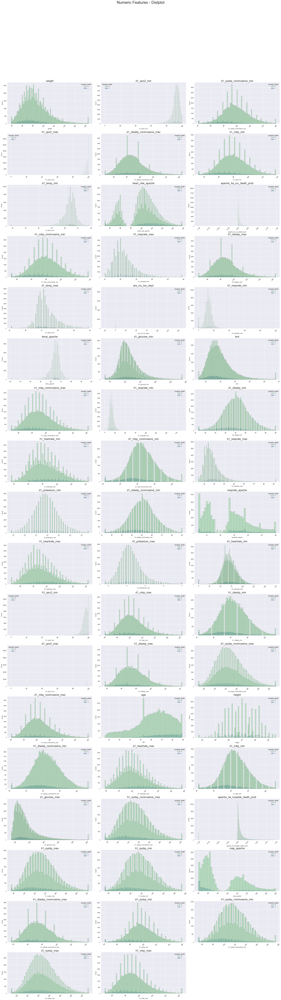

In [64]:
plot(function='histplot', df=pdf, by = TARGET, columns=numeric_features, title='Numeric Features - Distplot', ncols=3, save_path='./figures/numeric_features_x_target_histogram.png', dpi = 200)

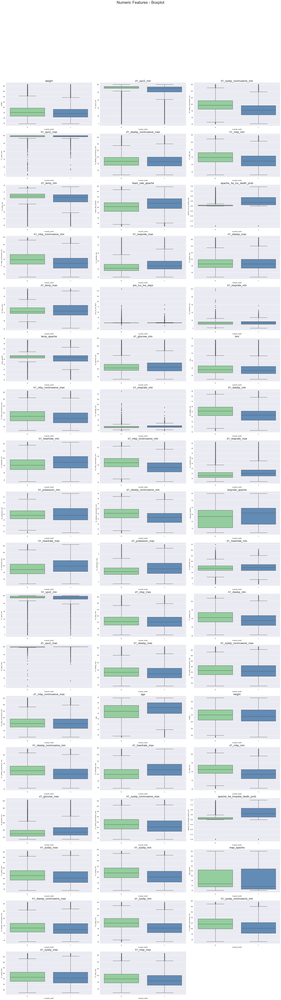

In [65]:
plot(function='boxplot', df=pdf, by = TARGET, columns=numeric_features, cross_axis=1,orient='h',title='Numeric Features - Boxplot', ncols=3, save_path='./figures/numeric_features_x_target_histogram.png', dpi = 200)


In [66]:
heat_map_corr(pdf, columns = categorical_features + numeric_features + [TARGET], title = "Pearson's Correlation", save_path = './figures/heat_map_corr.png', dpi = 200)

Several strong correlations are observed, however this will be adressed at the feature selection phase.

Export report to file: 100%|██████████| 1/1 [00:02<00:00,  2.99s/it]


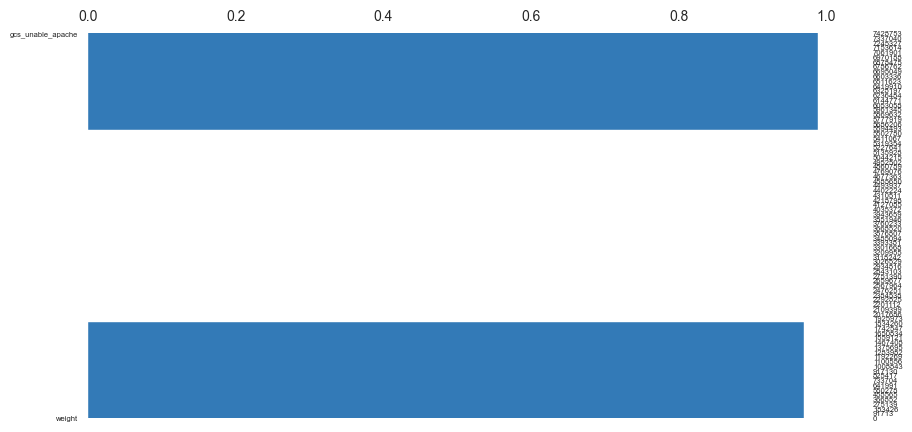

In [67]:
#EDA using pandas-profiling
profile = ProfileReport(pdf, explorative=True)

#Saving results to a HTML file
profile.to_file("EDA Report.html")

# Feature Selection
The next step for creating the model is Feature Selection